In [4]:
import hax
from decimal import*
import matplotlib.pyplot as plt
from matplotlib import patches
%matplotlib inline
import numpy as np
from matplotlib.colors import LogNorm #for 2D plot color scale
import scipy.optimize as opt 
from scipy.stats import chisquare
import pandas as pd
import pickle

#posrec 
from SiPMdata import *

## Code for importing and exporting lists/pd dataframes

In [5]:
hax.init(
    experiment='XAMS', 
    pax_version_policy='loose', use_runs_db = False,
    main_data_paths = ['/data/xenon/xams/run10/processed'],     #FOR AUTO PROCESSING
    minitree_paths = ['/data/xenon/xams/run10/processed'],
)

INFO:hax.__init__] Not looking for datasets in runs db since you put use_runs_db = False


PMT and SiPM data loading and property extraction (all peaks)

In [6]:
from hax.treemakers.peak_treemakers import PeakExtractor
class per_peak(PeakExtractor):
    __version__ = '0.1.0'
    # peak_cut_list = ['detector == "tpc"', 'type !="lone_hit"'] # Peak cuts not required, we want all of them
    peak_fields = ['area', 'range_50p_area','index_of_maximum', 'height', 'center_time'] 

In [ ]:
#pmt data processing
#---- per channel like SipmEventProperties:
#1. check coincidence to find S1. S1 trigger should be around 20us (20000 ns)!
#2. check how many S2 like are present
#3. Only pick events with S1 coincidence and single S2! 
#4. Define drift velocity from longest drift time (S2-S1)/10mm. 
#5. Plot S2 vs S1 area and identify photopeak events

#sipm data processing
#1. Use SiPM S1 S2 timing to identify the PMT S1/S2 pairs? 
#2. process external pmt data separately to get info? 
#3. sipm peaks ~ 5us after PMT peaks

In [ ]:
# #pmt class
# class PmtEventProperties(hax.minitrees.TreeMaker):
#     '''
#     Retrieves the SiPM peak and event information for calibration waveform.
#     '''
#     __version__ = '0.0.1'
#     extra_branches = ['*']
   

#     def extract_data(self, event):
# #         for i in range(2):
#         result = {}

#         #peak level
#         for peak in event.peaks:
#             result['total_area'] = peak.area
#             result['common_center_time'] = peak.center_time
#             result['total_height'] = peak.height
#             for a, area in enumerate(peak.area_per_channel):
#                 if a == 0: #SiPM 13
#                     result['pmt_area'] = area
#                     result['pmt_center_time'] = peak.center_time
#                     result['pmt_height'] = peak.height
#                     result['pmt_range_50p_area'] = list(peak.range_area_decile)[5]
#                 if a == 1: #SiPM 14
#                     result['nai_area'] = area
#                     result['nai_center_time'] = peak.center_time
#                     result['nai_height'] = peak.height
#                     result['nai_range_50p_area'] = list(peak.range_area_decile)[5]
 
            
#         return result
        

In [7]:
#sipm class
class SipmEventProperties(hax.minitrees.TreeMaker):
    '''
    Retrieves the SiPM peak and event information for calibration waveform.
    '''
    __version__ = '0.0.5'
    extra_branches = ['*']
   

    def extract_data(self, event):
#         for i in range(2):
        result = {}

        #peak level
        for peak in event.peaks:
            if peak.type == 's2':
                result['s2_area'] = peak.area
                result['s2_center_time'] = peak.center_time
                result['s2_height'] = peak.height
                result['s2_range_50p_area'] = list(peak.range_area_decile)[5]
                for a, area in enumerate(peak.area_per_channel):
                    if a == 0: #SiPM 13
                        result['s2_13_area'] = area
                    if a == 1: #SiPM 14
                        result['s2_14_area'] = area
                    if a == 3: #SiPM 14
                        result['s2_15_area'] = area
                    if a == 4: #SiPM 14
                        result['s2_16_area'] = area
                    if a == 5: #SiPM 14
                        result['s2_17_area'] = area
                    if a == 6: #SiPM 14
                        result['s2_18_area'] = area
                    if a == 7: #SiPM 14
                        result['s2_19_area'] = area
#             if peak.type == 's1':
#                 result['s1_area'] = peak.area
#                 result['s1_center_time'] = peak.center_time
#                 result['s1_height'] = peak.height
#                 result['s1_range_50p_area'] = list(peak.range_area_decile)[5]
#                 for a, area in enumerate(peak.area_per_channel):
#                     if a == 0: #SiPM 13
#                         result['s1_13_area'] = area
#                     if a == 1: #SiPM 14
#                         result['s1_14_area'] = area
#                     if a == 3: #SiPM 14
#                         result['s1_15_area'] = area
#                     if a == 4: #SiPM 14
#                         result['s1_16_area'] = area
#                     if a == 5: #SiPM 14
#                         result['s1_17_area'] = area
#                     if a == 6: #SiPM 14
#                         result['s1_18_area'] = area
#                     if a == 7: #SiPM 14
#                         result['s1_19_area'] = area
            
        return result
        

In [ ]:
# #PMT per peak properties (on 1724)
# pmt_events = [] #dataset list (bad liquid level)
# dataset_pmt = ['190609_112758'] #test data
# for dset in dataset_pmt:
#     pmt_events.append(hax.minitrees.load(dset, treemakers=[PmtEventProperties], force_reload = False))

In [ ]:
#PMT per peak properties (on 1724)
pmt_peaks = [] #dataset list
dataset_pmt = ['190610_085915_1724'] #test data
for dset in dataset_pmt:
    pmt_peaks.append(hax.minitrees.load(dset, treemakers=[per_peak], force_reload = True))

In [8]:
%%time

#SiPM per event/peak (separeate areas) (on 1730)
sipm = [] #dataset list
dataset_sipm = ['190604_161603_1730'] #test data
for dset in dataset_sipm:
    sipm.append(hax.minitrees.load(dset, treemakers=[SipmEventProperties], force_reload = False))

DEBUG:hax.minitrees] Found minitree at /data/xenon/xams/run10/processed/190604_161603_1730_SipmEventProperties.root
DEBUG:hax.minitrees] Found minitree at /data/xenon/xams/run10/processed/190604_161603_1730_SipmEventProperties.root
DEBUG:hax.minitrees] Removing weird index column


CPU times: user 806 ms, sys: 213 ms, total: 1.02 s
Wall time: 2.04 s


## SiPM and PMT data processing (Na22)

SiPM

In [9]:
sipm_data = sipm[0]

In [10]:
len(sipm_data)

387479

In [11]:
#events with NaN have no S1 signal, drop them! 
sipm_data = sipm_data.dropna()
# sipm_data = sipm_data.dropna()

In [12]:
len(sipm_data)

232238

In [ ]:
plt.figure()
plt.hist(sipm_data['s1_center_time'],range = (21000,30000))
plt.show()

In [ ]:
#cut on events with S1 around the correct trigger time
sipm_data = sipm_data[(sipm_data['s1_center_time'] > 21000) & (sipm_data['s1_center_time'] < 30000)]

In [ ]:
len(sipm_data)

PMT

In [ ]:
len(pmt_peaks[0])

In [ ]:
#select PMT events based on SiPM events with good S1 at right trigger time
pmt = pmt_peaks[0][pmt_peaks[0]['event_number'].isin(sipm_data['event_number'])]

In [ ]:
len(pmt)

In [ ]:
pmt['type'] = 'nan'

In [ ]:
%%time

#pick out S1s and S2s and dc from each event

events = np.unique(pmt['event_number']) #number of waveforms

for index, row in pmt.iterrows(): #line by line of wf (each line is a different peak)
    event = row['event_number']
    range_50p = row['range_50p_area']
    height = row['height']
    area = row['area']
    ct = row['center_time']
#     if ct < 21000 and ct > 1900: #s1 trigger window
    if range_50p < 60 and height > 4: #s1 should be less than 60ns and above 20pe
#             print('found s1 in event ', event)
        pmt.loc[index,'type'] = 's1'
    if range_50p > 100 and height > 4: #s2 search must be wider than 1 us.
#         print('found s2 in event ', event)
        pmt.loc[index,'type'] = 's2'
    if height < 4 :
        pmt.loc[index,'type'] = 'dc'

## PMT insitu Calibration

In [ ]:
#pick out non s1 and s2 like... 
pmt_dc = pmt[pmt['type'] == 'dc']

In [ ]:
len(pmt_dc)

In [ ]:
plt.figure()
plt.hist(pmt_dc['area'],bins=100,range=(0,5))
plt.title('pmt dark count distribution')
plt.xlabel('area (p.e.)')
plt.ylabel('counts')
plt.show()

## PMT S1/S2 SELECTION

In [ ]:
len(pmt)

In [ ]:
#get rid of dc peaks
pmt_s1s2 = pmt[pmt['type'] != 'dc']

In [ ]:
len(pmt_s1s2)

In [ ]:
len(sipm_data)

In [ ]:
%%time

#only keep events that have a single S1 and a single S2 - store in pmt_pairs

pmt_pairs = pd.DataFrame()

events = np.unique(pmt_s1s2['event_number']) #number of waveforms

for event in events: #loop over all events/waveforms
    wf = pmt_s1s2[pmt_s1s2['event_number'] == event] # get all peaks/rows from single event number
    s1_counter = 0
    s2_counter = 0
    for index, row in wf.iterrows(): #line by line of wf (each line is a different peak)
        if row['type'] == 's1':
#             print(row['type'],' found in event ',event)
            s1_counter  += 1 
        if row['type'] == 's2':
#             print(row['type'],' found in event ',event)
            s2_counter  += 1
    if s1_counter == 1 and s2_counter == 1:
#         print('pair found in event ', event)
        pmt_pairs = pmt_pairs.append([wf])
#         pmt_s1s2 = pmt_s1s2[pmt_s1s2.event_number == event]
#     if s1_counter > 1 or s2_counter > 1:
#         print('dropped event  ', event)

In [ ]:
len(pmt_pairs)

SiPM Further Cuts

In [ ]:
len(sipm_data)

In [ ]:
#onlly keep events that have single S1/S2 pair from PMT
sipm_pairs = sipm_data[sipm_data['event_number'].isin(pmt_pairs['event_number'])]

In [ ]:
len(pmt_pairs)/2

In [ ]:
len(sipm_pairs)

In [ ]:
len(np.unique(pmt_pairs['event_number']))

In [ ]:
len(np.unique(sipm_pairs['event_number']))

## PMT ONLY

SEARCH FOR S1/S2 PAIRS INDEPENDENT OF SIPMS

In [ ]:
pmt_all = pmt_peaks[0]

In [ ]:
len(pmt_all)

In [ ]:
pmt_all['type'] = 'nan'

In [ ]:
%%time

#pick out S1s and S2s and dc from each event

events = np.unique(pmt_all['event_number']) #number of waveforms

for index, row in pmt_all.iterrows(): #line by line of wf (each line is a different peak)
    event = row['event_number']
    range_50p = row['range_50p_area']
    height = row['height']
    area = row['area']
    if range_50p < 60 and height > 4: #s1 should be less than 60ns and above 20pe
        pmt_all.loc[index,'type'] = 's1'
    if range_50p > 100 and height > 4: #s2 search must be wider than 1 us.
        pmt_all.loc[index,'type'] = 's2'
    if height < 4:
        pmt_all.loc[index,'type'] = 'dc'

In [ ]:
%%time

#only keep events that have a single S1 and a single S2 - store in pmt_pairs

pmt_pairs = pd.DataFrame()

events = np.unique(pmt_all['event_number']) #number of waveforms

for event in events: #loop over all events/waveforms
    wf = pmt_all[pmt_all['event_number'] == event] # get all peaks/rows from single event number
    s1_counter = 0
    s2_counter = 0
    for index, row in wf.iterrows(): #line by line of wf (each line is a different peak)
        if row['type'] == 's1':
#             print(row['type'],' found in event ',event)
            s1_counter  += 1 
        if row['type'] == 's2':
#             print(row['type'],' found in event ',event)
            s2_counter  += 1
    if s1_counter == 1 and s2_counter == 1:
#         print('pair found in event ', event)
        pmt_pairs = pmt_pairs.append([wf])
#         pmt_s1s2 = pmt_s1s2[pmt_s1s2.event_number == event]
#     if s1_counter > 1 or s2_counter > 1:
#         print('dropped event  ', event)

In [ ]:
#---STORE ALL PROPERTIES OF DIFFERENT PMT DATA SETS!
s1_ct = []
s2_ct = []
s1_width = []
s2_width = []
s1_area = []
s2_area = []
for index, row in pmt_pairs.iterrows(): #look in each peak type
    if row['type'] == 's1':
        s1_ct.append(row['center_time'])
        s1_width.append(row['range_50p_area'])
        s1_area.append(row['area'])
    if row['type'] == 's2':
        s2_ct.append(row['center_time'])
        s2_width.append(row['range_50p_area'])
        s2_area.append(row['area'])
    

t_drift = [] #in us
v_drift = []
ps1_ct = []
ps2_ct = []
ps1_width = []
ps2_width = []
ps1_area = []
ps2_area = []
for t in range(len(s1_ct)):
    drift_time = s2_ct[t]/1000 - s1_ct[t]/1000 #in us
#     drift_velocity = 100/(s2_ct[t]/1000 - s1_ct[t]/1000) #(100mm/drift time in microseconds)
    if drift_time > 0:
        t_drift.append(drift_time)
        v_drift.append(1.50)
        ps1_ct.append(s1_ct[t])
        ps2_ct.append(s2_ct[t])
        ps1_width.append(s1_width[t])
        ps2_width.append(s2_width[t])
        ps1_area.append(s1_area[t])
        ps2_area.append(s2_area[t])
        
# for v in range(len(t_drift)):
#     v_drift.append(100/np.max(t_drift))
    

print('maximum drift time observed: %s us ' %np.max(t_drift))
print('corresponding drift velocity: %s mm/us ' %np.min(v_drift))

zrec = [] #in cm
for z in range(len(t_drift)):
    zrec.append((v_drift[z]*t_drift[z]/10)) 

In [ ]:
#save all values necessary for analysis to pd

#CHANGE NAME OF DATAFRAME TO RIGHT DATE!!!

na22_pmtonly_190610_152511_3mm = pd.DataFrame({'s1_ct':ps1_ct,'s2_ct':ps2_ct,'s1_width':ps1_width,'s2_width':ps2_width,
                                      's1_area':ps1_area,'s2_area':ps2_area,'zrec':zrec,
                                               't_drift':t_drift,'v_drift':v_drift})

na22_pmtonly_190610_152511_3mm.to_pickle('./na22_pmtonly_190610_152511_3mm.pkl')

In [ ]:
len(na22_pmtonly_190610_152511_3mm)

In [ ]:
plt.figure()
plt.hist(t_drift)
plt.show()

## Position Reconstruction Code

PMT zrec

In [ ]:
len(sipm_pairs)

In [ ]:
len(pmt_pairs)/2

In [ ]:
v_drift = 1.5 #mm/us
zrec = []
s1_ct = []
s2_ct = []

for index, row in pmt_pairs.iterrows(): #line by line of wf (each line is a different peak)
    if row['type'] == 's1':
        s1_ct.append(row['center_time'])
    if row['type'] == 's2':
        s2_ct.append(row['center_time'])

for z in range(len(s1_ct)):
    drift_time = s2_ct[z]/1000 - s1_ct[z]/1000 
    zrec.append(drift_time*v_drift*-1)

In [ ]:
len(sipm_data)

SiPM

Define general geometry parameters

In [13]:
# z position of the in-plane SiPMs
z_plane = 10
# radius of the cyinder for SiPMs at the side
r_cylinder = 22
# radius of a SiPM - I assume circular SiPMs with a radius to make the area correspond to a 3x3mm2 square.
r_sipm = 1.6925
# build geometry
geo = GeoParameters(z_plane=z_plane, r_cylinder=r_cylinder, r_sipm=r_sipm)

Define Geometry of SiPMs

In [14]:
# generate a XAMS geometry with SiPMs in plane above the LXe

#position of SiPMs

sipm = SiPM(type="plane",position=[0,-15,z_plane],qeff=0.25)
geo.add_sipm(sipm)
sipm = SiPM(type="plane",position=[-13,-7.5,z_plane],qeff=0.25)
geo.add_sipm(sipm)
sipm = SiPM(type="plane",position=[13,-7.5,z_plane],qeff=0.25)
geo.add_sipm(sipm)
sipm = SiPM(type="plane",position=[-4,0,z_plane],qeff=0.25)
geo.add_sipm(sipm)
sipm = SiPM(type="plane",position=[4,0,z_plane],qeff=0.25)
geo.add_sipm(sipm)
sipm = SiPM(type="plane",position=[-13,7.5,z_plane],qeff=0.25)
geo.add_sipm(sipm)
sipm = SiPM(type="plane",position=[13,7.5,z_plane],qeff=0.25)
geo.add_sipm(sipm)

# ring SiPMs
# n_circ = 6
# r = 17.5
# for phi in np.linspace(0,2*np.pi,n_circ,endpoint=False):
#     sipm = SiPM(type="plane",position=[r*np.cos(phi),r*np.sin(phi),z_plane],qeff=0.25)
#     geo.add_sipm(sipm)


In [15]:
%%time

#S2 Trigger only - ~9000 events!!!

#provide areas observed by each SiPM, reconstruct xy and save in a listsone at a time

#--------------------
sipm_x_loc = [0,-13,13,-4,4,-13,13]
sipm_y_loc = [-15,-7.5,-7.5,0,0,7.5,7.5]
sipm_locations = [[0,-15],[-13,-7.5],[13,-7.5],[-4,0],[4,0],[-13,7.5],[13,7.5]] #locations [[13x,13y],[14x,14y],...]
cols = ['r', 'b', 'g', 'cyan', 'purple', 'orange', 'k']

#------ data frame for events reconstructed outside of active volume
poor_reconstruction = pd.DataFrame(columns=['event_number', 'area_13','area_14', 'area_15','area_16',
                                           'area_17', 'area_18', 'area_19'])

good_reconstruction = pd.DataFrame(columns=['event_number', 'area_13','area_14', 'area_15','area_16',
                                           'area_17', 'area_18', 'area_19'])
#-------------


xrec = []
yrec = []

keys = ['s2_13_area','s2_14_area','s2_15_area','s2_16_area','s2_17_area','s2_18_area','s2_19_area']

s2_number = 0
poor_count = 0
good_count = 0
# plot = True
# for j in range(len(sipm_pairs)):
for j in range(len(sipm_data)):
    df = sipm_data[j:j+1]
    event = df['event_number'].values[0]
#     print('event #%i' %event)
    for i, key in enumerate(keys):
        hits = df[key].values
        geo.sipms[i].set_number_of_hits(hits)
#         print('sipm%i' % (i+13), 'area = ', df[key].values)
    posrec = Reconstruction(geo)
    result = posrec.reconstruct_position('CHI2')
#     print(result)
    posrec.df_rec = pd.DataFrame()
    posrec.df_rec = posrec.df_rec.append(result,ignore_index=True)
#     print(posrec.df_rec)
    xr = np.array(posrec.df_rec.xr)
    yr = np.array(posrec.df_rec.yr)
    xrec.append(*xr)
    yrec.append(*yr)
    
#     if xr < 20 and xr > -20 and yr < 20 and yr > -20:
    s2_number += 1
    if s2_number%100 == 0:
        print('processed %i S2s' %s2_number,'of ', len(sipm_data))
        
    #store poorly reconstructed events (outside of active volume)
    if (xr**2 + yr**2) > 22.5**2: #poorly reconstructed values
        
        #append data structure with poorly reconstructed values
        areas =  []#list of areas observed by each SiPM in poorly reconstructed event
        for a, key2 in enumerate(keys):
            areas.append(df[key2].values)

        poor_reconstruction = poor_reconstruction.append({'event_number':event, 'area_13':float(areas[0]),
                                                          'area_14':float(areas[1]),'area_15':float(areas[2]),
                                                          'area_16':float(areas[3]),'area_17':float(areas[4]),
                                                         'area_18':float(areas[5]),'area_19':float(areas[6])},
                                                             ignore_index = True)
        
#         if poor_count < 100:
#             print(poor_count)
#             print('event at radius = %i mm' % np.sqrt(xr**2 + yr**2))
#             sipm_number = [13,14,15,16,17,18,19]
#             fig, ax = plt.subplots()
#             ax.scatter(sipm_x_loc,sipm_y_loc,s = 3,marker = 's',color = 'blue', label = 'Active SiPMs')
#             ax.scatter(0,15,s = 3,marker = 's', color = 'red',label = 'Inactive SiPMs')    
#             for k,key in enumerate(keys):
#                 loc = sipm_locations[k]
#                 plt.scatter(*loc, s=df[key].values, c=cols[k], marker = 's',
#                             alpha = 0.2) #label = 'SiPM# ' + str(sipm_number[k])
#                 plt.text(loc[0]-1.2,loc[1]+1.5,round(int(df[key].values))) #add 'PE'
#                 plt.text(loc[0]-0.8,loc[1]-2.0,str(sipm_number[k]), color = 'blue')
#             plt.text(0-0.8,15-2.0,str(20), color = 'red')
#             plt.plot(xr,yr,marker = '*',linestyle = 'none', markersize = '6',color = 'black', 
#                      label = 'reconstructed position')
#             #plot active volume
#             tpc_ring_inner = plt.Circle((0, 0), radius = 22.5,linewidth = 1, linestyle = '-', color='k',
#                                         fill=False, label = 'XAMS Active Volume')
#             ax.add_artist(tpc_ring_inner)
#             ax.set_xlim((-25, 25))
#             ax.set_ylim((-25, 25))
#             ax.set_aspect(1)
# #             plt.title('Photoelectrons perSiPM in event %i' % event)
#             plt.xlabel('x(mm)')
#             plt.ylabel('y(mm)')
#             plt.xlim(-30,30)
#             plt.ylim(-30,30)
#             plt.legend(bbox_to_anchor=[2.1,1.0],prop={'size': 15},scatterpoints=1,numpoints = 1)
#             poor_count += 1
#             plt.show()
        
        
        
        
        
#     store good reconstructed events (inside of active volume)
    if (xr**2 + yr**2) < 22.5**2: #good reconstructed values
        
        #append data structure with poorly reconstructed values
        areas =  []#list of areas observed by each SiPM in poorly reconstructed event
        for a, key2 in enumerate(keys):
            areas.append(df[key2].values)

        good_reconstruction = good_reconstruction.append({'event_number':event, 'area_13':float(areas[0]),
                                                          'area_14':float(areas[1]),'area_15':float(areas[2]),
                                                          'area_16':float(areas[3]),'area_17':float(areas[4]),
                                                         'area_18':float(areas[5]),'area_19':float(areas[6])},
                                                             ignore_index = True)
        
#         if good_count < 20:
#             print('event at radius = %i mm' % np.sqrt(xr**2 + yr**2))
#             sipm_number = [13,14,15,16,17,18,19]
#             fig, ax = plt.subplots()
#             ax.scatter(sipm_x_loc,sipm_y_loc,s = 3,marker = 's',color = 'blue', label = 'Active SiPMs')
#             ax.scatter(0,15,s = 3,marker = 's', color = 'red',label = 'Inactive SiPMs')    
#             for k,key in enumerate(keys):
#                 loc = sipm_locations[k]
#                 plt.scatter(*loc, s=df[key].values, c=cols[k], marker = 's',
#                             alpha = 0.2) #label = 'SiPM# ' + str(sipm_number[k])
#                 plt.text(loc[0]-1.2,loc[1]+1.5,round(int(df[key].values))) #add 'PE'
#                 plt.text(loc[0]-0.8,loc[1]-2.0,str(sipm_number[k]), color = 'blue')
#             plt.text(0-0.8,15-2.0,str(12), color = 'red')
#             plt.plot(xr,yr,marker = '*',linestyle = 'none', markersize = '6',color = 'black', 
#                      label = 'reconstructed position')
#             #plot active volume
#             tpc_ring_inner = plt.Circle((0, 0), radius = 22.5,linewidth = 1, linestyle = '-', color='k',
#                                         fill=False, label = 'XAMS Active Volume')
#             ax.add_artist(tpc_ring_inner)
#             ax.set_xlim((-25, 25))
#             ax.set_ylim((-25, 25))
#             ax.set_aspect(1)
#             plt.title('Photoelectrons observed by each SiPM in event %i' % event)
#             plt.xlabel('x(mm)')
#             plt.ylabel('y(mm)')
#             plt.xlim(-40,40)
#             plt.ylim(-40,40)
#             plt.legend(bbox_to_anchor=[2.1,1.0],prop={'size': 15},scatterpoints=1,numpoints = 1)
#             good_count += 1
#             plt.show()

<SiPMdata.SiPM object at 0x7f30030aaef0>  n =  [ 2.03456319]
<SiPMdata.SiPM object at 0x7f3003110278>  n =  [ 5.69139179]
<SiPMdata.SiPM object at 0x7f30030aa668>  n =  [ 3.04563942]
<SiPMdata.SiPM object at 0x7f30030aae48>  n =  [ 4.00243273]
<SiPMdata.SiPM object at 0x7f30030aae80>  n =  [ 1.55567644]
<SiPMdata.SiPM object at 0x7f30030b1828>  n =  [ 1.34515288]
<SiPMdata.SiPM object at 0x7f30030b1400>  n =  [ 1.45182252]
m_status = False
<SiPMdata.SiPM object at 0x7f30030aaef0>  n =  [ 7.27382206]
<SiPMdata.SiPM object at 0x7f3003110278>  n =  [ 1.41341262]
<SiPMdata.SiPM object at 0x7f30030aa668>  n =  [ 6.48776428]
<SiPMdata.SiPM object at 0x7f30030aae48>  n =  [ 1.68986177]
<SiPMdata.SiPM object at 0x7f30030aae80>  n =  [ 2.19308549]
<SiPMdata.SiPM object at 0x7f30030b1828>  n =  [ 2.26421329]
<SiPMdata.SiPM object at 0x7f30030b1400>  n =  [ 5.82972648]
m_status = False
<SiPMdata.SiPM object at 0x7f30030aaef0>  n =  [ 10.94976886]
<SiPMdata.SiPM object at 0x7f3003110278>  n =  [ 2

In [21]:
good_reconstruction.to_pickle("./alpha_good_reconstruction.pkl")

In [22]:
poor_reconstruction.to_pickle("./alpha_poor_reconstruction.pkl")

In [16]:
len(xrec)

232238

In [17]:
len(yrec)

232238

In [18]:
len(zrec)

NameError: name 'zrec' is not defined

In [19]:
#export reconstructed values
import pickle

with open('alpha_recx.pkl', 'wb') as f:
    pickle.dump(xrec, f)
    
with open('alpha_recy.pkl', 'wb') as f:
    pickle.dump(yrec, f)
    
#save poor and good recnstruction as alpha names!


## Reconstruction xy distribution

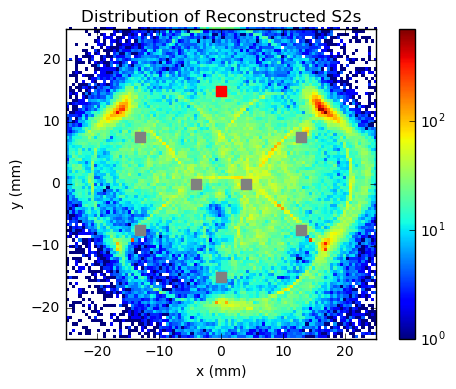

In [20]:
tpc_ring_inner = plt.Circle((0, 0), radius = 22.5,linewidth = 1, linestyle = '--', color='k', fill=False)
sipm_ring = plt.Circle((0, 0), radius = 14.475, linewidth = 5, linestyle = '--',color='m', fill=False)
# circle2 = plt.Circle((0.5, 0.5), 0.2, color='blue')
# circle3 = plt.Circle((1, 1), 0.2, color='g', clip_on=False)

sipm_number = [13,14,15,16,17,18,19]
sipm_x_loc = [0,-13,13,-4,4,-13,13]
sipm_y_loc = [-15,-7.5,-7.5,0,0,7.5,7.5]
sipm_locations = [[0,-15],[-13,-7.5],[13,-7.5],[-4,0],[4,0],[-13,7.5],[13,7.5]]
cols = ['r', 'b', 'g', 'cyan', 'purple', 'orange', 'k']
keys = ['s2_13_area','s2_14_area','s2_15_area','s2_16_area','s2_17_area','s2_18_area','s2_19_area']
for k,key in enumerate(keys):
        loc = sipm_locations[k]
        plt.text(loc[0]-1.2,loc[1]+1.5,round(int(df[key].values))) #add 'PE'
        plt.text(loc[0]-0.8,loc[1]-2.0,str(sipm_number[k]), color = 'blue')

plt.text(0-0.8,15-2.0,str(12), color = 'red')


fig, ax = plt.subplots()
h = ax.hist2d(xrec,yrec, bins=100,range = ((-25,25),(-25,25)), norm=LogNorm())
plt.title('Distribution of Reconstructed S2s')
plt.xlabel('x (mm)')
plt.ylabel('y (mm)')
# ax.add_artist(sipm_ring)
# ax.add_artist(tpc_ring_inner)
ax.set_xlim((-25, 25))
ax.set_ylim((-25, 25))
ax.set_aspect(1)

#plot location of SiPMs
ax.scatter(sipm_x_loc,sipm_y_loc,s = 50,marker = 's',color = 'grey', label = 'Active SiPMs')
ax.scatter(0,15,s = 50,marker = 's', color = 'red',label = 'Inactive SiPMs')

plt.colorbar(h[3], ax=ax)
# fig.savefig('./posrec_figs/reconstruction_190604_161603.pdf')
plt.show()

3D distribution of reconstructed events 

## Comparison of 'good' and 'poor' reconstructed events (chi2 based)

'Poor'

In [ ]:
len(good_reconstruction)

In [ ]:
sipm_x_loc = [0,-13,13,-4,4,-13,13]
sipm_y_loc = [-15,-7.5,-7.5,0,0,7.5,7.5]
sipm_locations = [[0,-15],[-13,-7.5],[13,-7.5],[-4,0],[4,0],[-13,7.5],[13,7.5]] #locations [[13x,13y],[14x,14y],...]
cols = ['r', 'b', 'g', 'cyan', 'purple', 'orange', 'k']
keys = ['area_13','area_14','area_15','area_16','area_17','area_18','area_19']

counter = 0
for j in range(len(poor_reconstruction)):
    df = poor_reconstruction[j:j+1]
    event = df['event_number'].values[0]
    #     print('event #%i' %event)
    individual_areas = []
    for i, key in enumerate(keys):
        hits = df[key].values
        individual_areas.append(float(hits))
        geo.sipms[i].set_number_of_hits(hits)
    print('fraction observed by each SiPM in event %i:' %event)
    for i, key in enumerate(keys):
        hits = float(df[key].values)
        print('SiPM#' + str(i+13) + '=', hits/np.sum(individual_areas))
    posrec = Reconstruction(geo)
    result = posrec.reconstruct_position('CHI2')
    #     print(result)
    posrec.df_rec = pd.DataFrame()
    posrec.df_rec = posrec.df_rec.append(result,ignore_index=True)
    #     print(posrec.df_rec)
    xr = np.array(posrec.df_rec.xr)
    yr = np.array(posrec.df_rec.yr)
    
    print('reconstruted at r = %i' %np.sqrt(xr**2+yr**2))
    
    sipm_number = [13,14,15,16,17,18,19]
    
    
    #plots
    print(xr,yr)
    if xr < -10 and yr > 10:
        print('yes')
        fig, ax = plt.subplots()
        ax.scatter(sipm_x_loc,sipm_y_loc,s = 3,marker = 's',color = 'blue', label = 'Active SiPMs')
        ax.scatter(0,15,s = 3,marker = 's', color = 'red',label = 'Inactive SiPMs')    
        for k,key in enumerate(keys):
            loc = sipm_locations[k]
            plt.scatter(*loc, s=df[key].values, c=cols[k], marker = 's',
                        alpha = 0.2) #label = 'SiPM# ' + str(sipm_number[k])
            plt.text(loc[0]-1.2,loc[1]+1.5,round(int(df[key].values))) #add 'PE'
            plt.text(loc[0]-0.8,loc[1]-2.0,str(sipm_number[k]), color = 'blue')
        plt.text(0-0.8,15-2.0,str(12), color = 'red')
        plt.plot(xr,yr,marker = '*',linestyle = 'none', markersize = '6',color = 'black', 
                 label = 'reconstructed position')
        #plot active volume
        tpc_ring_inner = plt.Circle((0, 0), radius = 22.5,linewidth = 1, linestyle = '-', color='k',
                                    fill=False, label = 'XAMS Active Volume')
        ax.add_artist(tpc_ring_inner)
        ax.set_xlim((-25, 25))
        ax.set_ylim((-25, 25))
        ax.set_aspect(1)
        plt.title('Photoelectrons observed by each SiPM in event %i' % event)
        plt.xlabel('x(mm)')
        plt.ylabel('y(mm)')
        plt.xlim(-40,40)
        plt.ylim(-40,40)
        plt.legend(bbox_to_anchor=[2.1,1.0],prop={'size': 15},scatterpoints=1,numpoints = 1)
        plt.show()
        counter+= 1
        if counter == 20:
            break

'good'

In [ ]:
good_reconstruction

In [ ]:
sipm_x_loc = [0,-13,13,-4,4,-13,13]
sipm_y_loc = [-15,-7.5,-7.5,0,0,7.5,7.5]
sipm_locations = [[0,-15],[-13,-7.5],[13,-7.5],[-4,0],[4,0],[-13,7.5],[13,7.5]] #locations [[13x,13y],[14x,14y],...]
cols = ['r', 'b', 'g', 'cyan', 'purple', 'orange', 'k']
keys = ['area_13','area_14','area_15','area_16','area_17','area_18','area_19']

counter = 0
for j in range(len(good_reconstruction)):
    df = good_reconstruction[j:j+1]
    event = df['event_number'].values[0]
    #     print('event #%i' %event)
    individual_areas = []
    for i, key in enumerate(keys):
        hits = df[key].values
        individual_areas.append(float(hits))
        geo.sipms[i].set_number_of_hits(hits)
    print('fraction observed by each SiPM in event %i:' %event)
    for i, key in enumerate(keys):
        hits = float(df[key].values)
        print('SiPM#' + str(i+13) + '=', hits/np.sum(individual_areas))
    posrec = Reconstruction(geo)
    result = posrec.reconstruct_position('CHI2')
    #     print(result)
    posrec.df_rec = pd.DataFrame()
    posrec.df_rec = posrec.df_rec.append(result,ignore_index=True)
    #     print(posrec.df_rec)
    xr = np.array(posrec.df_rec.xr)
    yr = np.array(posrec.df_rec.yr)
    
    print('reconstruted at r = %i' %np.sqrt(xr**2+yr**2))
    
    sipm_number = [13,14,15,16,17,18,19]
    
    
    #plots
    fig, ax = plt.subplots()
    ax.scatter(sipm_x_loc,sipm_y_loc,s = 3,marker = 's',color = 'blue', label = 'Active SiPMs')
    ax.scatter(0,15,s = 3,marker = 's', color = 'red',label = 'Inactive SiPMs')    
    for k,key in enumerate(keys):
        loc = sipm_locations[k]
        plt.scatter(*loc, s=df[key].values, c=cols[k], marker = 's',
                    alpha = 0.2) #label = 'SiPM# ' + str(sipm_number[k])
        plt.text(loc[0]-1.2,loc[1]+1.5,round(int(df[key].values))) #add 'PE'
        plt.text(loc[0]-0.8,loc[1]-2.0,str(sipm_number[k]), color = 'blue')
    plt.text(0-0.8,15-2.0,str(12), color = 'red')
    plt.plot(xr,yr,marker = '*',linestyle = 'none', markersize = '6',color = 'black', 
             label = 'reconstructed position')
    #plot active volume
    tpc_ring_inner = plt.Circle((0, 0), radius = 22.5,linewidth = 1, linestyle = '-', color='k',
                                fill=False, label = 'XAMS Active Volume')
    ax.add_artist(tpc_ring_inner)
    ax.set_xlim((-25, 25))
    ax.set_ylim((-25, 25))
    ax.set_aspect(1)
    plt.title('Photoelectrons observed by each SiPM in event %i' % event)
    plt.xlabel('x(mm)')
    plt.ylabel('y(mm)')
    plt.xlim(-40,40)
    plt.ylim(-40,40)
    plt.legend(bbox_to_anchor=[2.1,1.0],prop={'size': 15},scatterpoints=1,numpoints = 1)
    plt.show()
    counter+= 1
    if counter == 20:
        break

Reconstruct a single event

In [ ]:
posrec = Reconstruction(geo)
result = posrec.reconstruct_position('LNLIKE')
print(result)
posrec.df_rec = pd.DataFrame()
posrec.df_rec = posrec.df_rec.append(result,ignore_index=True)
print(posrec.df_rec)

In [ ]:
posrec.plot(type="xy",range=((-25,25),(-25,25)))

In [ ]:
sipm_locations = [[0,-15],[-13,-7.5],[13,-7.5],[-4,0],[4,0],[-13,7.5],[13,7.5]] #locations [[13x,13y],[14x,14y],...]
keys = ['13_area','14_area','15_area','16_area','17_area','18_area','19_area']
cols = ['r', 'b', 'g', 'cyan', 'purple', 'orange', 'k']

for j in range(2):
    event = df['event_number'].values[0]
    for i, key in enumerate(keys):
        df = large_s2s[j:j+1]
        loc = sipm_locations[i]
        plt.scatter(*loc, s=df[key].values, c=cols[i], label = key)
    plt.title('relative area observed by each SiPM in event %i' % event)
    plt.xlabel('x(mm)')
    plt.ylabel('y(mm)')
    plt.legend(bbox_to_anchor=[1.4,1],prop={'size': 15},scatterpoints=1)
    plt.show()

SiPM Properties

In [ ]:

area_eff = 9 #effective area in mm^2

#areas per channel
areas_per_channel = [np.array(large_s2s['13_area']),np.array(large_s2s['14_area']),np.array(large_s2s['15_area']),
                     np.array(large_s2s['16_area']),np.array(large_s2s['17_area']),np.array(large_s2s['18_area']),
                     np.array(large_s2s['19_area'])]

#total area in S2
total_areas = np.array(large_s2s['area'])

In [ ]:
for i in areas_per_channel:
    print(i[0])

Chi-squared function to be fitted

In [ ]:

def chi2(n0,x0,y0):
    #sipm propertie
    a_eff = 9 #in mm^2
    
    #expected number of photons 
    chi2 = []
    for i in range(len(sipm_locations)):
        expected = n0*(a_eff/4*np.pi*np.abs([x0,y0] - [sipm_locations[i]])**2)
        observed = areas_per_channel[0][i] #area of each of the 7 channels
    chi2.append((expected - obs_area))
    
    chi2 = []
    for obs_area in observed:
    chi2.append((expected - obs_area))
    
    #chi2 value for each sensor
    chi2 = []
    chi2.append(((expected - area_observed)**2)/expected)
    
    return np.sum(chi2)
    

In [ ]:
#reconstruction
recs = []
for sim in sims:
    rec = Reconstruction(sim=sim)
    rec.emulate_events(n_uv=50000,n_event=1000,method="CHI2",plot=False,nbins=100,range=((-30,30),(-30,30)))
    recs.append(rec)

In [ ]:
len(sipm_s2s[sipm_s2s['height'] > 1])

In [ ]:
plt.figure()
plt.hist(sipm_s2s['area'],bins = 100, range = (1000,10000))
plt.show()

Histograms of all peak properties (may not make sense to do this until we pick out S1s and S2s)

In [ ]:
areas = np.array(sipm[0]['area'])
range_50p = np.array(sipm[0]['range_50p_area'])
plt.hist2d(areas,range_50p,bins = 1000, range=((0,8),(0,40)), norm=LogNorm())
plt.show()

In [ ]:
# def sort_peaks(dataset,peak_high,peak_low):
#     peaks = []
#     for a in range(len(dataset)):
#         peaks.append((dataset[a][(dataset[a]['center_time'] < peak_high) & (dataset[a]['center_time'] > peak_low)]))

In [ ]:
# sipm[0][(sipm[0]['event_number'] == 4) & (sipm[0]['range_50p_area'] > 1000)]

In [ ]:
# def central_area_cut(dataset,time_upper):
#     for k, q in enumerate(dataset):
#          dataset[k] = q[q['range_50p_area'] < time_upper]

In [ ]:
events = np.unique(sipm[0]['event_number']) #number of events 
for event in events:
    print('----------',event,'----------')
    event_data = sipm[0][sipm[0]['event_number'] == event]
    peak_areas = np.sort(np.array(event_data['area'])) #from minimum to maximum
    peak_heights = np.sort(np.array(event_data['height'])) #from minimum to maximum
    peak_center_times = np.array(event_data['center_time'])
    peak_index_of_maximums = np.array(event_data['index_of_maximum'])
    peak_50p_areas = np.sort(np.array(event_data['range_50p_area'])) #from minimum to maximum 
    
    
    
#     print(peak_areas)
#     print(peak_heights)
#     print(peak_50p_areas)
    
#     search for some key properties
#     s2_area = np.max(peak_areas)
    
#     s2 = np.max(peak_50p_areas)
#     print('s2 50p_area is %i ns' %s2)
    
#     #-----plot some properties
#     print('----------',event,'----------')
    
    plt.figure()
    plt.title('Peak Area vs 50p_area for event %i' % event)
    plt.hist2d(peak_areas,peak_50p_areas)
    plt.show()
    
    plt.figure()
    plt.title('Peak Area vs Height for event %i' % event)
    plt.hist2d(peak_areas,peak_heights)
    plt.show()
    if event == 30:
        break

In [ ]:
num_events